# Tutorial FFNN ROM of NLEBB - Part 1
Using neural networks for reduced order modeling (ROM) of the nonlinear Euler-Bernoulli beam (NLEBB) by *learning the reduced forces*.

---

Lecture: "Physics-augmented machine learning" @ Cyber-Physical Simulation, TU Darmstadt

Lecturer: Prof. Oliver Weeger

Author: Jasper O. Schommartz

Summer term 2025

---

#### In this notebook, you will...

* calibrate an NN-based reduced order model (ROM) of the linear Euler-Bernoulli beam
* learn how the ROM can be built using Sobolev training.
* experience how Sobolev training can improve performance in numerical simulations.

In [ ]:
# Run this cell if you are using Google Colab
!git clone https://github.com/CPShub/LecturePhysicsAwareML.git
%cd LecturePhysicsAwareML/FFNN_ROM
%pip install -e.

In [ ]:
# Run this cell if your are working locally
%cd ..
% pip install -e.

## 1. Recap of ROM with POD

<img src="../img/beam.png" alt="Beam Image" width="600">

Proper orthogonal decomposition (POD) is a data-driven method for finding a reduced basis that approximates the behavior of a dynamical system. Based on the snapshot matrix $\mathbb{S} = (\boldsymbol{u}_1,\boldsymbol{u}_1, ...) \in \mathbb{R}^{N\times M}$, which contains time series data of the degrees of freedoms, e.g. displacements, the reduced basis $\boldsymbol{Q} = (\mathbb{u}_1, ..., \mathbb{u}_m) \in \mathbb{R}^{N \times m}$ is found using singular value decomposition (SVD).

After applying POD to the dynamics of the nonlinear Euler-Bernoulli beam, the behavior can be described by the following nonlinear differential equation

$$
\boldsymbol{Q}^T \boldsymbol{M} \boldsymbol{Q}\ddot{\boldsymbol{q}} + \tilde{\boldsymbol{f}}(\boldsymbol{q}) = \boldsymbol{Q}^T \boldsymbol{b}(t),
$$

where the nonlinear function $\tilde{\boldsymbol{f}}(\boldsymbol{q}) = \boldsymbol{Q}^T \boldsymbol{f}(\boldsymbol{Q}\boldsymbol{q})$ describes the internal forces in terms of the reduces degrees of freedom $\boldsymbol{q}$. The simulation of the equation above requires a time integration scheme. For this lecture the Newmark method was implemented in the `nlebb_dynamic_proj.m` MATLAB script. It makes use of the linearization of $\tilde{\boldsymbol{f}}(\boldsymbol{q})$, which is given in terms of the reduced stiffnes matrix $\tilde{\boldsymbol{K}} = \boldsymbol{Q}^T \boldsymbol{K} \boldsymbol{Q}$. $\tilde{\boldsymbol{K}}(\boldsymbol{q})$ is related to $\tilde{\boldsymbol{f}}(\boldsymbol{q})$ via the derivative as

$$
\tilde{\boldsymbol{K}}(\boldsymbol{q}) = \frac{\partial \tilde{\boldsymbol{f}}(\boldsymbol{q})}{\partial \boldsymbol{q}}
$$

## 2. Task summary

In this task we aim to train a FFNN-based model to approximate the nonlinear functions $\tilde{\boldsymbol{f}}(\boldsymbol{q})$ and $\tilde{\boldsymbol{K}(\boldsymbol{q})}$ replacing the numerically expensive evaluation of $\boldsymbol{Q}^T \boldsymbol{f}(\boldsymbol{Q}\boldsymbol{q})$ during the beam simulation. Since $\tilde{\boldsymbol{f}}(\boldsymbol{q})$ and $\tilde{\boldsymbol{K}(\boldsymbol{q})}$ are related via the derivative, *Sobolev training* shall be used for the calibration.

The task involves four step, where one is covered by this notebook:

1. Determination of the reduced basis using POD and SVD (`nlebb_dynamic_svd.m`)
2. Generation of training and test data sets for $\boldsymbol{q}$, $\tilde{\boldsymbol{f}}$, and $\tilde{\boldsymbol{K}}$ using the reduced basis (`nlebb_dynamic_proj.m`)
3. Training and evaluation of a FFNN-based surrogate model (this Jupyter Notebook)
4. Application of the FFNN in the beam simulation (`nlebb_dynamic_proj.m`)

## 3. FFNN-based model

<img src="../img/ffnn_01.PNG" alt="FFNN 1" width="600">

The model consists of of two custom layers. `MLP` represents the FFNN and `Gradient` computes the gradients of the FFNN with respect to its inputs. The gradients are computed using automatic differentiation with the `tf.GradientTape()` module provided by Tensorflow.

In [1]:
import tensorflow as tf
from tensorflow.keras import layers


class MLP(layers.Layer):
    """A feed-forward neural network"""

    def __init__(self, units, activation):
        super().__init__()
        self.layers = []
        for u, a in zip(units, activation):
            self.layers += [layers.Dense(u, a)]

    def call(self, x):
        for layer in self.layers:
            x = layer(x)
        return x


class Gradient(layers.Layer):
    """Computes the gradient of another layer and returns
    it together with the function value."""

    def __init__(self, layer):
        super().__init__()
        self.layer = layer
        self.flatten = layers.Flatten()

    def call(self, x):
        with tf.GradientTape() as g:
            g.watch(x)
            y = self.layer(x)
        dy = g.batch_jacobian(y, x)
        return y, self.flatten(dy)

To create the model, the `build()` function is called. It connects the input values to the output values and compiles the model with the desired optimizer and loss function. By setting the `loss_weights` property, the importance of every output can be adjusted for better training. In this case the first value value defines the weight of the function values $\tilde{\boldsymbol{f}}(\boldsymbol{q})$, while the second value defines the weights for the stiffness matrix $\frac{\partial \tilde{\boldsymbol{f}}(\boldsymbol{q})}{\partial \boldsymbol{q}}$.

In [2]:
def build(qm, loss_weights=[1, 1], *args, **kwargs):
    """Builds an evaluation model that returns the nodal displacements"""
    # define input shape
    x = tf.keras.Input(shape=(qm,))
    # define which (custom) layers the model uses
    mlp = MLP(*args, **kwargs)
    y, dy = Gradient(mlp)(x)
    # connect input and output
    model = tf.keras.Model(inputs=[x], outputs=[y, dy])
    # define optimizer and loss functions
    model.compile("adam", loss=["mse", "mse"], loss_weights=loss_weights)
    return model

## 4. Data generation and Preprocessing

Data generation is contucted a-priori via execution of the `nlebb_dynamic_svd.m`and `nlebb_dynamic_proj.m` scripts. The following types of excitations of the cantilever beam were used for data generation:

* Quasi-static: $Q(t) = A/5 \cdot t$
* Dirac: $Q(t) = A\ \text{if}\ 2.5 < t < 2.51$
* Step: $Q(t) = A\ \text{if}\ t > 2.5$
* Sine: $Q(t) = A \sin(2 \pi f t)$
* Multisine with phase shift: $Q_i(t) = \sum_{k=1}^{n} y_{i, k}(t)\quad$ with $\quad y_{i, k}(t) = A_k \sin(2 \pi f_k t + \varphi_k + \phi_i)\quad$ and $\quad \varphi_k = \frac{-k(k-1)}{n}\pi\quad$ and $\quad \phi_i = \frac{2 \pi (i -1)}{n_{ph}}$

**Training cases**:

* Multisine with $A = 2 N$, $n = 100$, $f_0 = 0.085 Hz$, $n_{ph} = 3$, $i = 1, ..., 3$ and a total simulation time of $t_{max} = 5s$

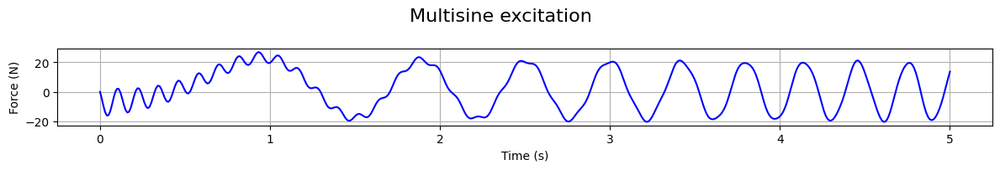

In [3]:
import numpy as np
import paml_rom.data as data

t = np.linspace(0, 5, 500)
data.multisin(2, 0.085, 100, 0, 3, t)

**Test cases**:

* Quasi-static with $A = -10$
* Dirac with $A = -10$
* Step with $A = -10$
* Sine with $A = 1.5 N$ and $f = 6 Hz$
* Multisine with $A = 1 N$, $n = 78$, $f_0 = 0.103 Hz$, $n_{ph} = 1$, $i = 1$

All training and test cases were simulated for a total time of $t_{max} = 5s$.

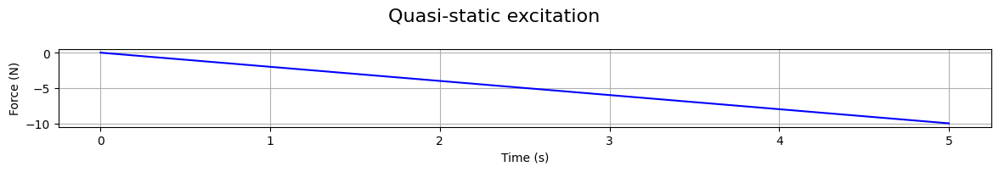

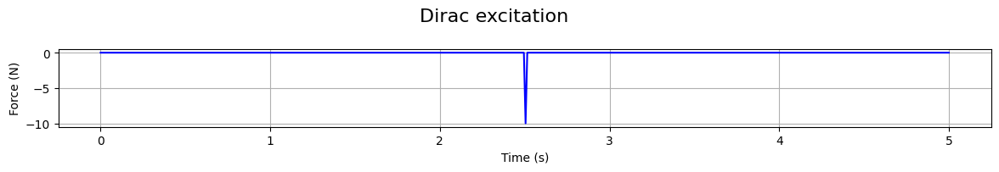

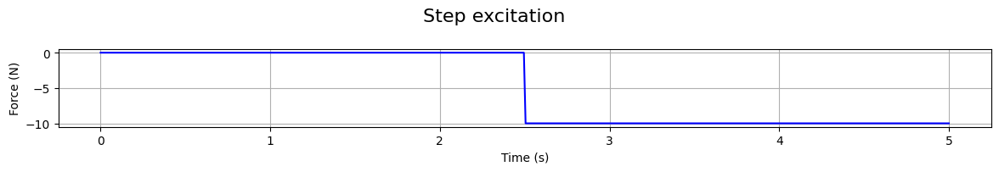

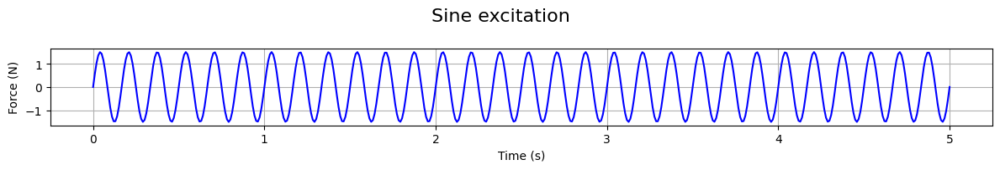

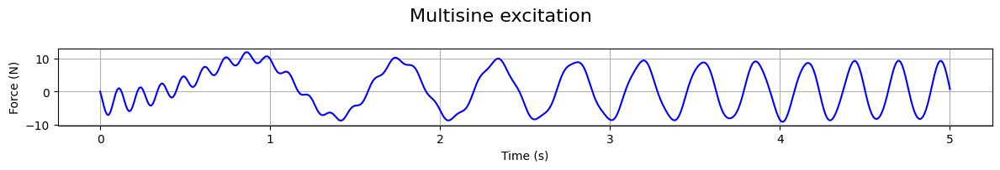

In [4]:
data.quasistatic(-10, t)
data.dirac(-10, 2.5, t)
data.step(-10, 2.5, t)
data.sine(1.5, 6, t)
data.multisin(1, 0.103, 78, 0, 1, t)

As mentioned, the excitations presented above were used to generate data for the internal reduced forces and stiffnesses $\tilde{\boldsymbol{f}}$ and $\tilde{\boldsymbol{K}}$. This data is not loaded as training data from the `Tasks/FFNN/data/` directory.

In [5]:
from pathlib import Path
from paml_rom import data


# Select training data files
data_dir = Path("..") / "data" / "multisin_train"
files_q = ["q0all_1.txt", "q0all_2.txt", "q0all_3.txt"]
files_Qf = ["Qfall_1.txt", "Qfall_2.txt", "Qfall_3.txt"]
files_QKQ = ["QKQall_1.txt", "QKQall_2.txt", "QKQall_3.txt"]

# Read data from txt files
q, Qf, QKQ = data.read_data(data_dir, files_q, files_Qf, files_QKQ)
m = q.shape[0]
n = q.shape[1]

print(f"Loaded {m} data samples.")

Loaded 48003 data samples.


Secondly, the internal forces and stiffnesses are visialized.

**Task**: Take a look at the plotted data and try to answer the following questions:

* Which internal forces correlate most with the excitation? What does this tell you about their importance for the model?
* Why don't we normalize the data despite the discrepancy in the orders of magnitude?
* What other solutions are there for fitting data of different magnitudes?

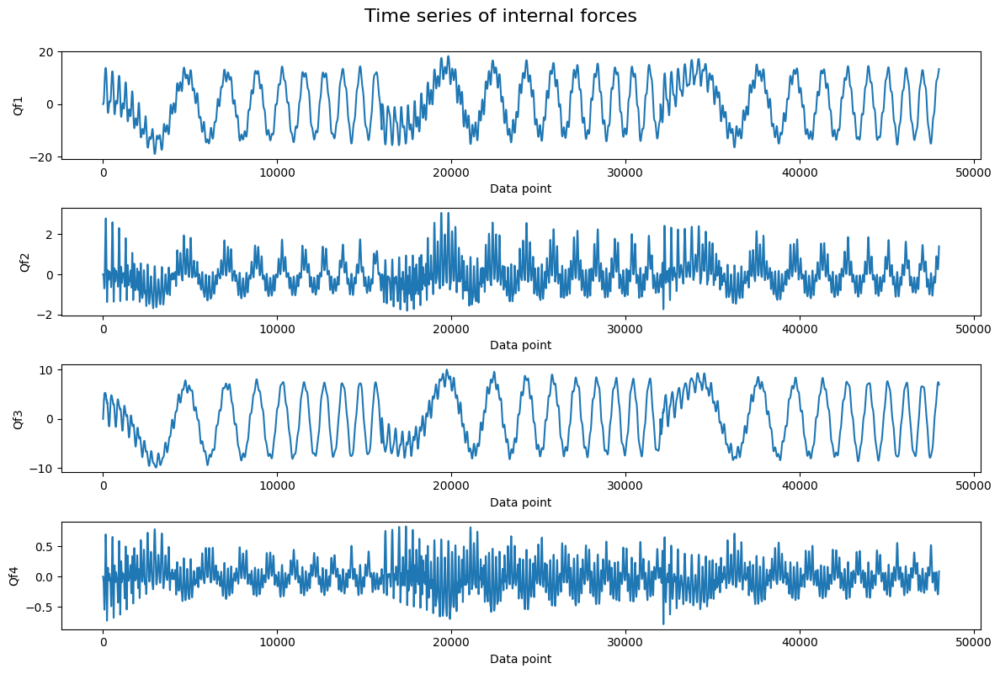

In [6]:
from paml_rom import plot

plot.plot_forces(Qf)

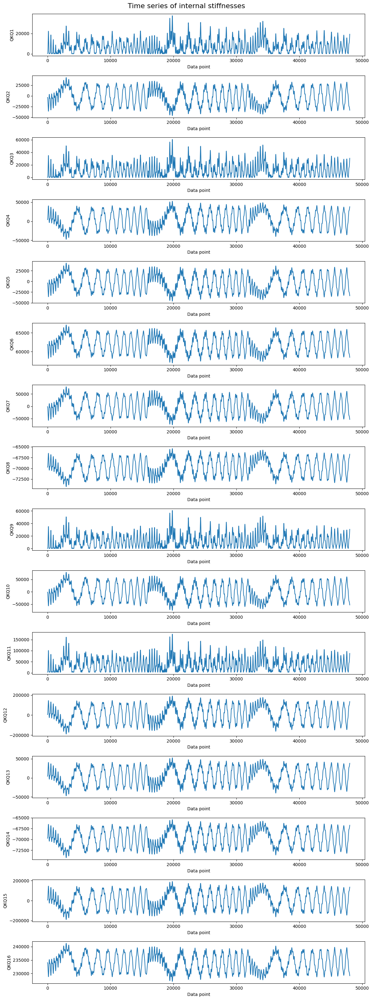

In [7]:
plot.plot_stiffnesses(QKQ)

## 5. Building and calibrating the model

The `build()` function is called with the desired `loss_weights`, `units`, i.e., node number, `activation` and `non_neg` constraints.

**Task**: Make changes to the number of nodes as well as the loss weights and investigate the impact on model performance.

In [9]:
model = build(
    qm=n,
    loss_weights=[1, 5e-7],  # [1, 5e-7],
    units=[16, 16, 16, 16, n],
    activation=["tanh", "tanh", "tanh", "tanh", "linear"],
)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 4)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gradient (Gradient)             │ [(None, 4), (None,     │           964 │
│                                 │ 16)]                   │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 964 (3.77 KB)

 Trainable params: 964 (3.77 KB)

 Non-trainable params: 0 (0.00 B)

Next, the model is fitted to the training data after defining the number of training epochs, i.e, `NEPOCHS`, and the learning rate for the ADAM optimizer.

**Task:** Train the model in increments of 500 epochs and observe how the prediction quality on test and training data changes.

Epoch 1/50000
47/47 - 1s - 25ms/step - gradient_loss: 5731542016.0000 - loss: 2892.9419
Epoch 2/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731320832.0000 - loss: 2886.5369
Epoch 3/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731490304.0000 - loss: 2874.8337
Epoch 4/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731427328.0000 - loss: 2870.2727
Epoch 5/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731423744.0000 - loss: 2869.1709
Epoch 6/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731551232.0000 - loss: 2868.6577
Epoch 7/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731139584.0000 - loss: 2868.2642
Epoch 8/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731288576.0000 - loss: 2867.9060
Epoch 9/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731070464.0000 - loss: 2867.5688
Epoch 10/50000
47/47 - 0s - 2ms/step - gradient_loss: 5731087872.0000 - loss: 2867.2461
Epoch 11/50000
47/47 - 0s - 2ms/step - gradient_loss: 5730733568.0000 - loss: 2866.9348
Epoch 12/50000
47/47 - 0s - 2ms/step - g

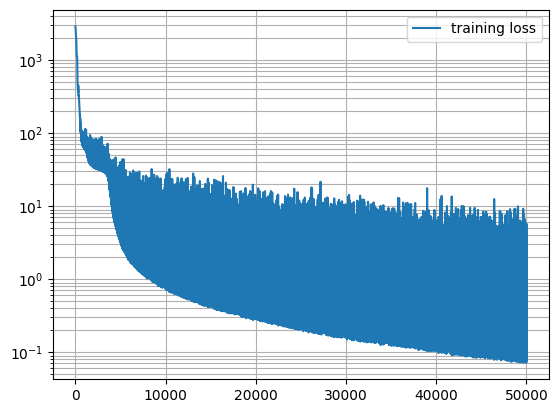

In [10]:
from matplotlib import pyplot as plt

NEPOCHS = 50000
model.optimizer.learning_rate.assign(0.001)
h = model.fit([q], [Qf, QKQ], epochs=NEPOCHS, verbose=2, batch_size=1024)

plt.semilogy(np.linspace(1, NEPOCHS, NEPOCHS), h.history["loss"], label="training loss")
plt.grid(which="both")
plt.legend()
plt.show()

The model is saved for later use and the weights are saved in a txt file for use in the beam simulation.

In [11]:
# Save model
name = "force"
model.save_weights(f"{name}.weights.h5")

# Save weights to list and txt-file
with open(f"{name}.weights.txt", "w") as f:
    for weights in model.get_weights():
        weights = weights.reshape(-1)
        f.write(" ".join(str(val) for val in weights) + "\n")

*Run this cell if you want to load a pre-trained model*

In [40]:
from pathlib import Path

fname = "force.weights.h5"
model.load_weights(Path("..") / "data" / fname)

## 6. Evaluation

To evaluate the performance of the trained model, it must be tested on unseen data.

### 6.1 Evaluation on training data

However, in the first step we reevaluate the model on the training data to check that no underfitting has occured and that the model is theoretically able to interpolate the data.

In [12]:
from paml_rom import evaluation as eval

# Get model predictions
Qf_pred, QKQ_pred = model(q)

# Evaluate
df_Qf_pred, df_QKQ_pred = eval.evaluate(Qf, Qf_pred, QKQ, QKQ_pred)
df_Qf_pred

c:\Users\schommartz\Documents\git_environment\LecturePhysicsAwareML\FFNN_ROM\.venv\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1']
Received: inputs=Tensor(shape=(48003, 4))
  warnings.warn(msg)


,Qf1,Qf2,Qf3,Qf4
MSE,0.012905,0.019503,0.017311,0.024795
R2,0.999845,0.966889,0.999392,0.579185


In [13]:
df_QKQ_pred

,QKQ1,QKQ2,QKQ3,QKQ4,QKQ5,QKQ6,QKQ7,QKQ8,QKQ9,QKQ10,QKQ11,QKQ12,QKQ13,QKQ14,QKQ15,QKQ16
MSE,61390.755707,242620.716285,83324.213173,176125.188433,31072.014377,143247.413711,71159.122957,146401.396905,11837.390580,66954.158680,58745.920719,131029.632510,28545.126655,175624.088129,90666.721684,205695.149009
R2,0.998541,0.999432,0.999268,0.999676,0.999927,0.974021,0.999945,0.965275,0.999896,0.999948,0.999938,0.999983,0.999948,0.958343,0.999988,0.981097


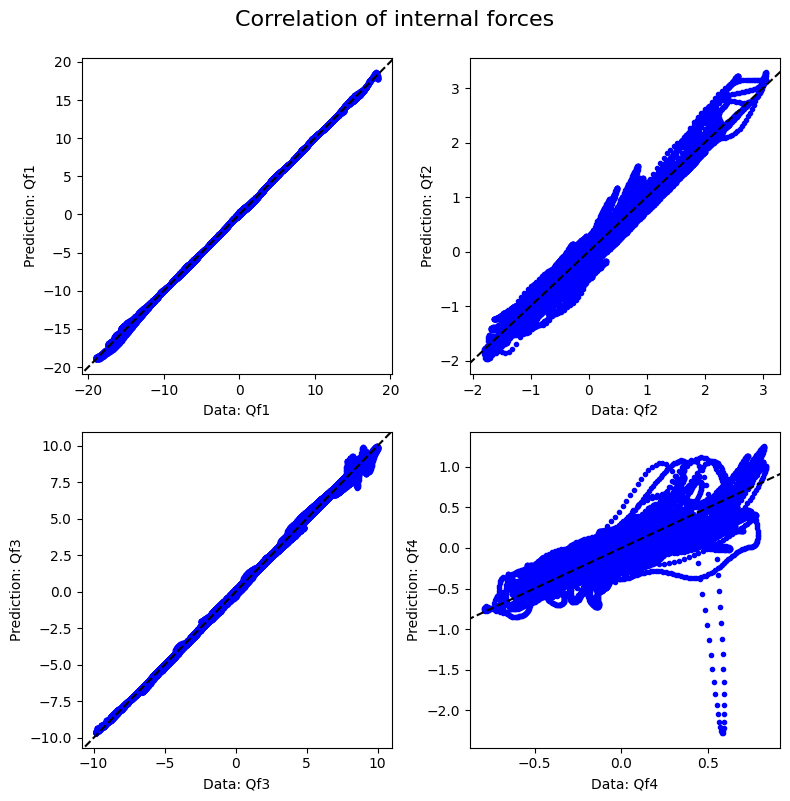

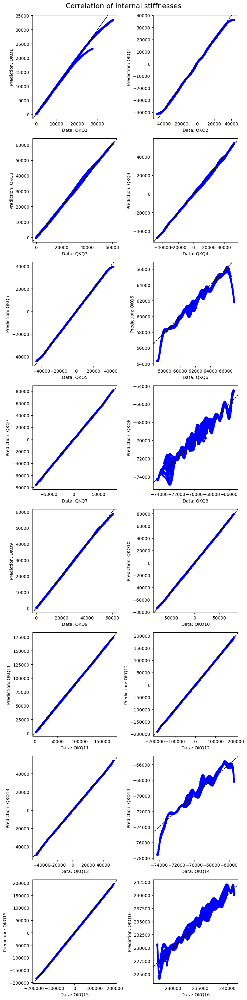

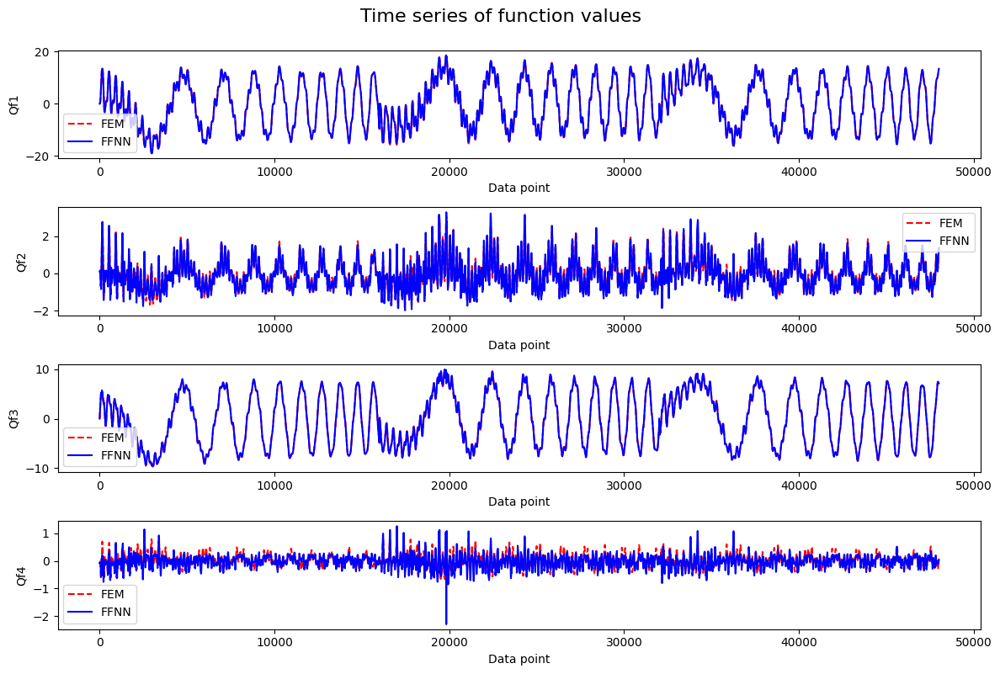

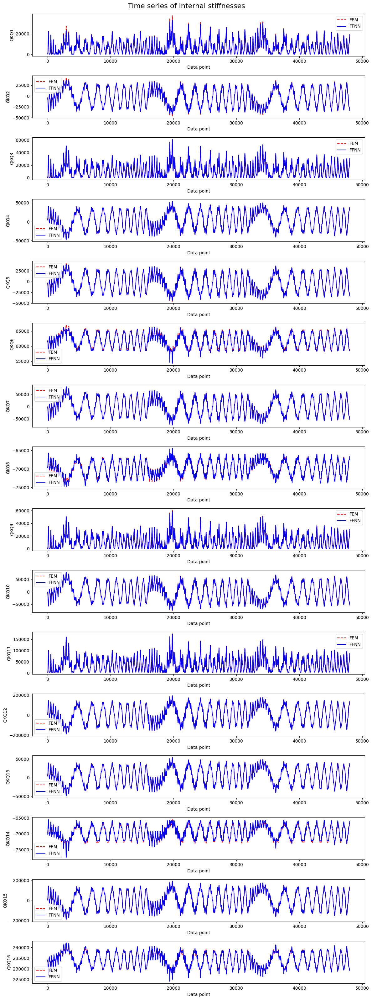

In [14]:
from paml_rom import plot

plot.plot_predictions(q, Qf, Qf_pred, QKQ, QKQ_pred)

### 6.2 Evaluation on testing data

Finally, the model is evaluated on the testing data.

In [15]:
from pathlib import Path
import paml_rom.data as data
import paml_rom.evaluation as eval


# Select training data files
data_dir = Path("..") / "data" / "step_test"
files_q = ["q0all.txt"]
files_Qf = ["Qfall.txt"]
files_QKQ = ["QKQall.txt"]

# Read data from txt files
q_test, Qf_test, QKQ_test = data.read_data(data_dir, files_q, files_Qf, files_QKQ)
print(f"Loaded {q_test.shape[0]} data samples.")

# Get model predictions
Qf_pred_test, QKQ_pred_test = model(q_test)

# Evaluate
df_Qf_test, df_QKQ_test = eval.evaluate(Qf_test, Qf_pred_test, QKQ_test, QKQ_pred_test)

Loaded 16001 data samples.


c:\Users\schommartz\Documents\git_environment\LecturePhysicsAwareML\FFNN_ROM\.venv\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1']
Received: inputs=Tensor(shape=(16001, 4))
  warnings.warn(msg)


The mean squared errors and autocorrelations between the predicted and actual function values are

In [16]:
df_Qf_test

,Qf1,Qf2,Qf3,Qf4
MSE,0.016960,0.033113,0.046943,0.060767
R2,0.998866,0.939933,0.989290,0.125028


The mean squares errors and autocorrelations between the predicted and actual derivatives are 

In [17]:
df_QKQ_test

,QKQ1,QKQ2,QKQ3,QKQ4,QKQ5,QKQ6,QKQ7,QKQ8,QKQ9,QKQ10,QKQ11,QKQ12,QKQ13,QKQ14,QKQ15,QKQ16
MSE,11671.678891,172752.580172,61605.171015,695769.090670,5179.128062,131235.316625,96487.068683,168833.962348,4145.398275,41654.572365,111867.729901,165373.972295,6295.554260,124597.415863,221052.361003,235647.476625
R2,0.999364,0.997711,0.998577,0.992601,0.999931,0.868229,0.999567,0.772007,0.999904,0.999813,0.999657,0.999882,0.999933,0.831744,0.999842,0.879900


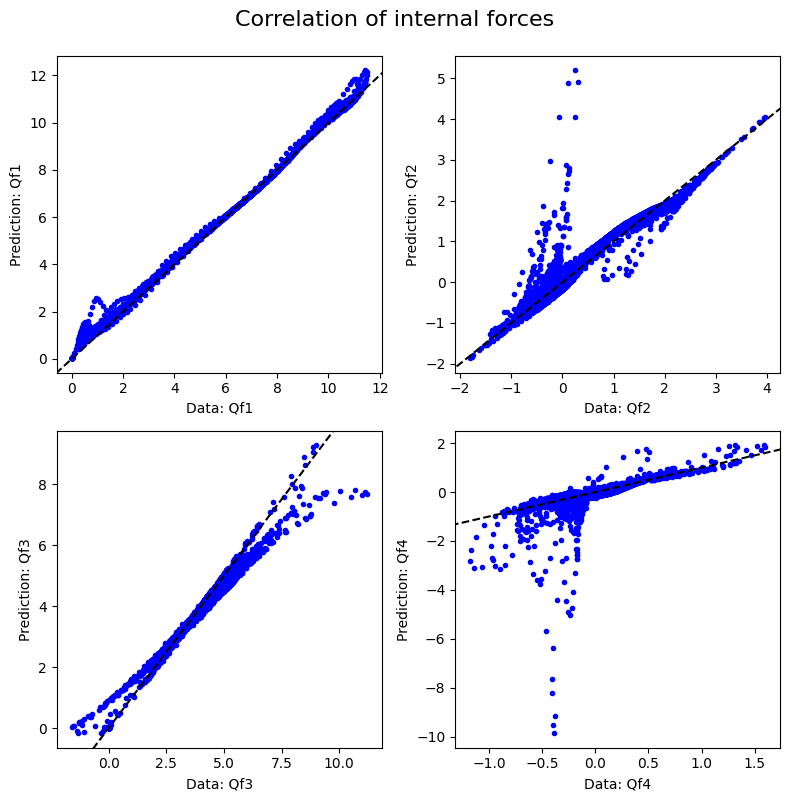

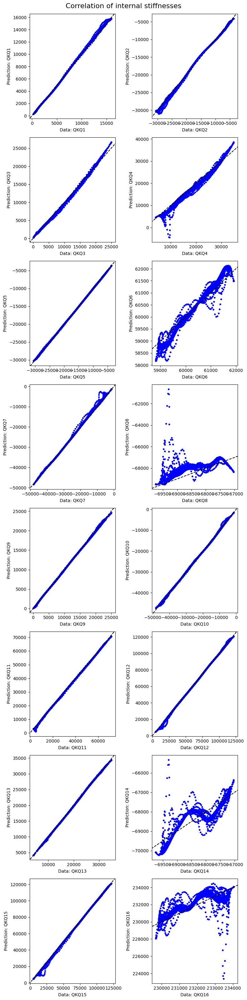

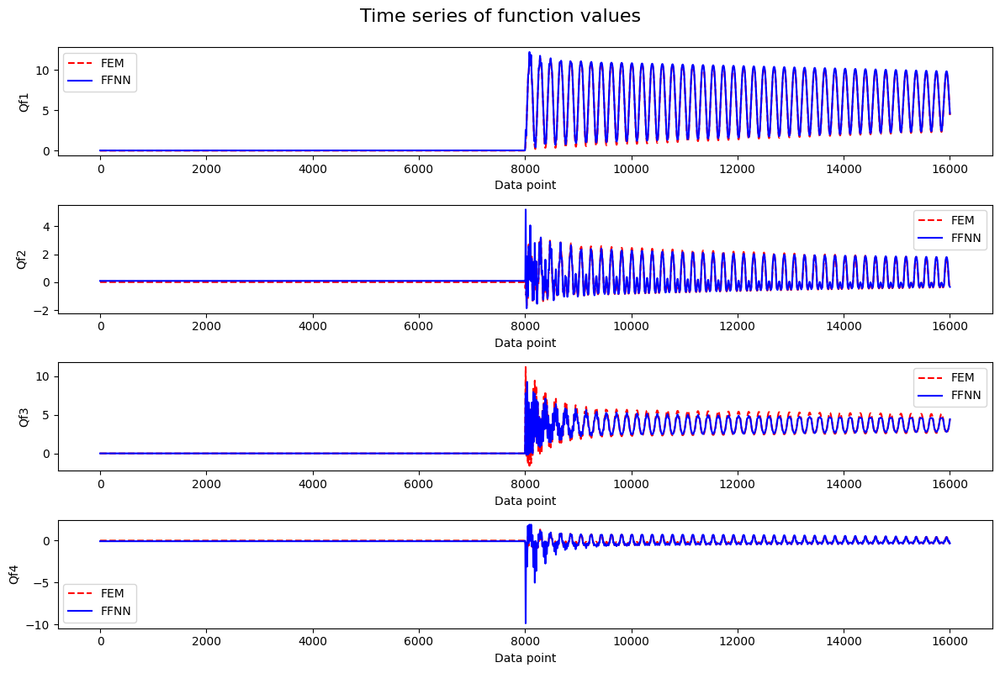

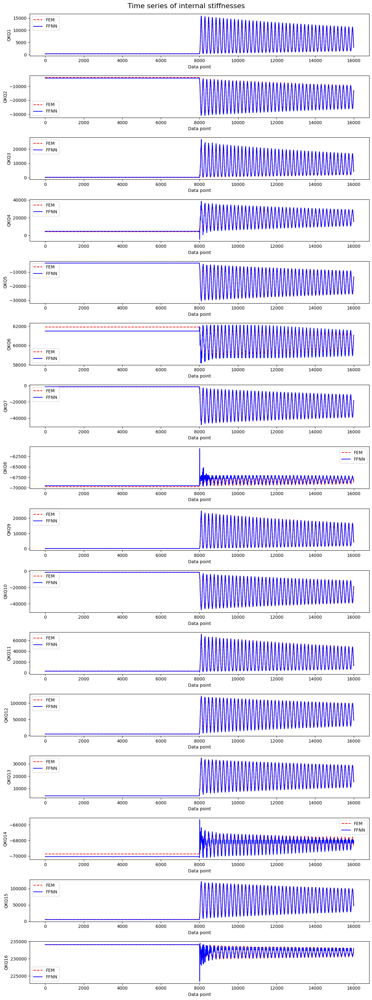

In [18]:
from paml_rom import plot

plot.plot_predictions(q_test, Qf_test, Qf_pred_test, QKQ_test, QKQ_pred_test)